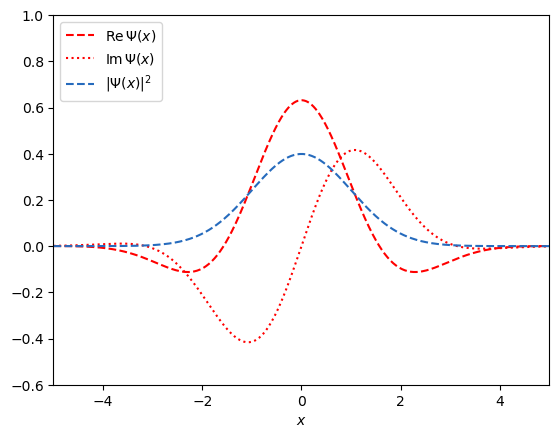

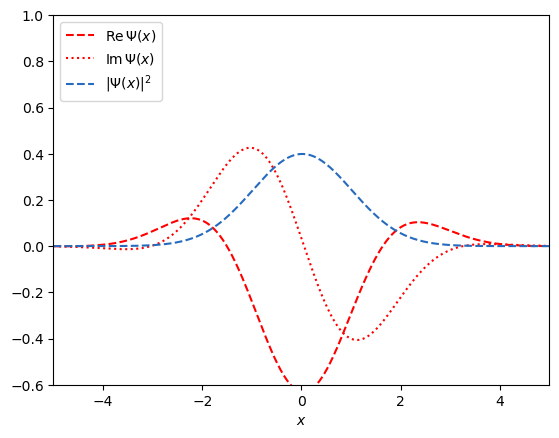

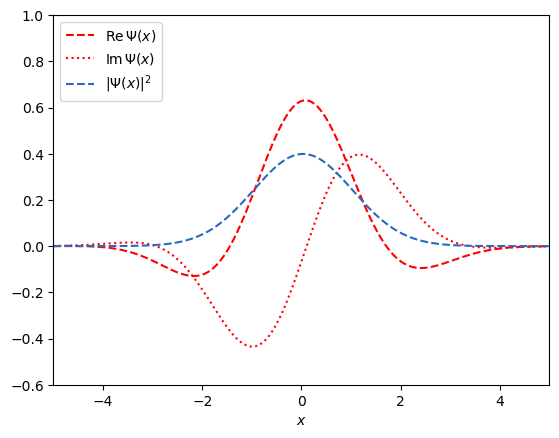

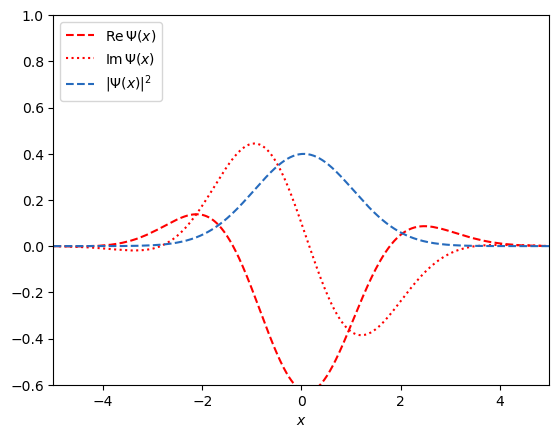

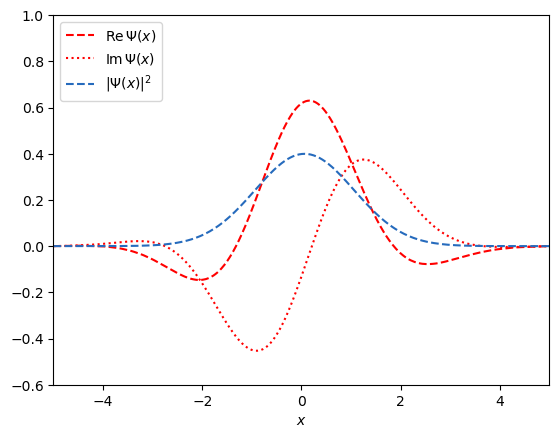

...

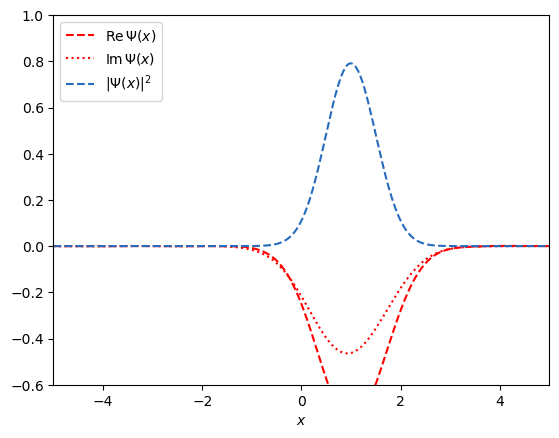

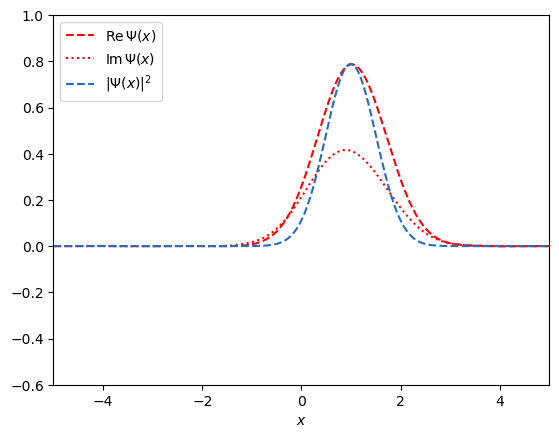

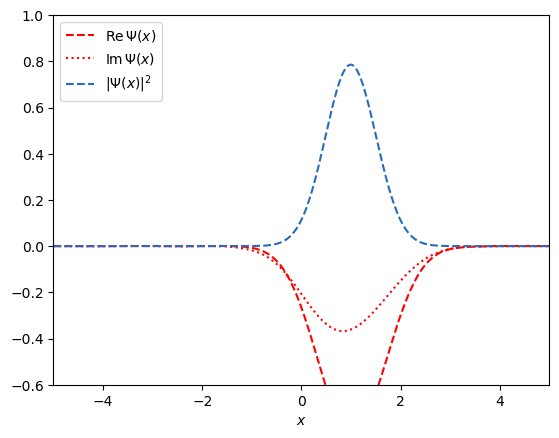

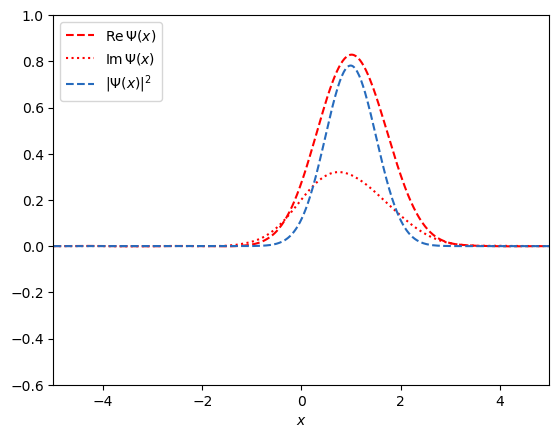

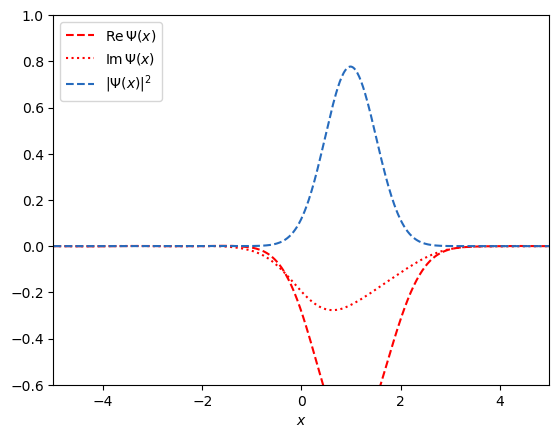

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# define the potential for the harmonic oscillator
def V(x):
    # V=0.5*m*w**2x**2
    # let m=w=1
    return 0.5*x**2

# define the domain
N = 512                 # no. of grid points
x_domain = [-5.0, 5.0]  # spatial domain

dx = (x_domain[1] - x_domain[0]) / (N-1)    # define spatial step size
dt = 1.0/64.0                               # define temporal step size

x = np.linspace(x_domain[0], x_domain[1], N)    # define grid points

# create Hamiltonian matrix and calculate its eigenvectors and eigenvalues
# use finite differences to approximate derivatives to 2nd order
H = ( -0.5*(np.diag(np.ones(N-1), k=-1) - np.diag(np.ones(N-1), k=+1)) / (dx**2) + np.diag(V(x)) ) * dt

Lambda, Q = np.linalg.eigh(H)   # returns the eigenvalues and eigenvectors of H
Q_inv = Q.conj().transpose()    # inverse of eigenvector Q (i.e., Q^-1=Q^+)

# initial Gaussian wave packet
d = np.sqrt(2.0)
k = 1.0
Psi = 1.0/(np.pi**(0.25)*np.sqrt(d)) * np.exp(-x**2.0/(2.0*d**2) + 1j*k*x)

# propagate 512 time steps
for l in range(0, 512):
    plt.clf()   # clear current figure
    plt.plot(x, Psi.real, "--", color="r", label=r'$\mathrm{Re}\, \Psi(x)$')    # r'string' means raw string
    plt.plot(x, Psi.imag, ":", color="r", label=r'$\mathrm{Im}\, \Psi(x)$')
    plt.plot(x, Psi.real**2+Psi.imag**2, "--", color="#266bbd", label=r'$|\Psi(x)|^2$')
    plt.gca().set_xlim(x_domain[0], x_domain[1])    # gca() means get current axis
    plt.gca().set_ylim(-0.6, 1.0)    # set_ylim means set axis view limit
    plt.xlabel(r'$x$')
    plt.legend(loc='upper left')
    plt.draw()  # redraw current figure
    plt.show()
    plt.pause(0.01) # run the GUI event loop for interval seconds
    Psi = np.dot(Q_inv, Psi)    # expand into eigenfunctions/vectors
    Psi *= np.exp(-1j*Lambda)   # propagate eigenfunctions/vectors
    Psi = np.dot(Q, Psi)        # superpose eigenfunctions/vectors